# Drift Detection Example

data:
    https://archive.ics.uci.edu/ml/machine-learning-databases/wine-quality/

In [1]:
import drift

C:\Users\scors\AppData\Roaming\Python\Python38\site-packages\sklearn\utils\deprecation.py:143: FutureWarning: The sklearn.metrics.classification module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.metrics. Anything that cannot be imported from sklearn.metrics is now part of the private API.
  warnings.warn(message, FutureWarning)


In [2]:
import pandas as pd
import numpy as np

In [3]:
df = pd.read_csv('data/winequality-white.csv', sep=";")

columns used in to evaluate drift

In [4]:
columns = ['fixed acidity', 'volatile acidity',]

In [5]:
df = df[columns]

In [6]:
df.isna().sum()

fixed acidity       0
volatile acidity    0
dtype: int64

In [7]:
df.shape

(4898, 2)

Training dataset, which has "normal" data.

The important thing is the size of the training dataset, since it is the one that determines the size that will be taken into account in future predictions, that is, if the size of the prediction dataset is smaller, an oversampling is carried out, if it is larger, it is carried out. a stratified sample with clustering

a stratified sampling is performed on the training data, parameter sample_size

In [8]:
drift_estimator = drift.DriftEstimator(delta=0.002, window=50, sample_size=0.5)

The number of clusters used in the stratification of the sample is obtained, it is obtained automatically using the elbow method, the sample_size parameter was established

cluster sampling


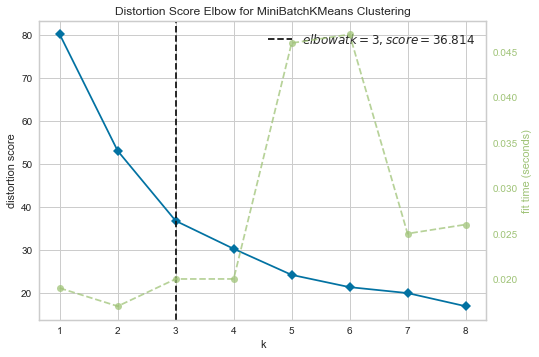

In [9]:
drift_estimator.fit(df)

the drift should tend to 0 in training

In [10]:
drift_estimator.drift_average

0.0

drift adjustment displayed during training for each column

In [11]:
drift_estimator.plot_train()

we observe the percentage of drift of each column

In [12]:
drift_estimator.percentage

change_fixed acidity       0.0
change_volatile acidity    0.0
dtype: float64

statistics of the values of each column-

In [13]:
drift_estimator.describe_fit

change_fixed acidity       0.000000
change_volatile acidity    0.000000
mean_fixed acidity         0.471687
mean_volatile acidity      0.194917
std_fixed acidity          0.127904
std_volatile acidity       0.099553
dtype: float64

we look at the size of the trained dataset. the same size will be used in future predictions

In [14]:
drift_estimator.size

2449

as you can see, it is 50% of the size of the original dataset

In [15]:
df.shape

(4898, 2)

Now we predict on the same training dataset, a sample will automatically be taken that matches the size of the training dataset.

what is aspired is that before "same" datasets there is no drift

In [16]:
drift_estimator.predict(df)

cluster sampling


0.0

As can be seen, the average drift that is predicted is 0, which means that there is no drift (or it is very low).

In [17]:
drift_estimator.drift_average_predict

0.0

we can observe the total of drifts found in each column

In [18]:
drift_estimator.totals_predict

change_fixed acidity       0.0
change_volatile acidity    0.0
dtype: float64

now the drift percentage of each column

In [19]:
drift_estimator.percentage_predict

change_fixed acidity       0.0
change_volatile acidity    0.0
dtype: float64

and the statistics of each column

In [20]:
drift_estimator.describe_predict

change_fixed acidity       0.000000
change_volatile acidity    0.000000
mean_fixed acidity         0.471203
mean_volatile acidity      0.195548
std_fixed acidity          0.126708
std_volatile acidity       0.096985
dtype: float64

we visualize the training drift adjustment versus the drift of the prediction dataset

In [21]:
drift_estimator.plot_predict()

we visualize the statistics by comparing those of training with those of the prediction (the value of changes is 0)

In [22]:
drift_estimator.plot_describe()

If we predict again, we can see that the model does not memorize the data of the last prediction, but that it preserves the behavior of the first training, that is, it does not learn from the new data.

In [23]:
drift_estimator.predict(df)

cluster sampling


0.0

In [24]:
drift_estimator.drift_average_predict

0.0

In [25]:
drift_estimator.totals_predict

change_fixed acidity       0.0
change_volatile acidity    0.0
dtype: float64

In [26]:
drift_estimator.percentage_predict

change_fixed acidity       0.0
change_volatile acidity    0.0
dtype: float64

In [27]:
drift_estimator.describe_predict

change_fixed acidity       0.000000
change_volatile acidity    0.000000
mean_fixed acidity         0.471254
mean_volatile acidity      0.194187
std_fixed acidity          0.127116
std_volatile acidity       0.096406
dtype: float64

In [28]:
drift_estimator.plot_predict()

In [29]:
drift_estimator.plot_describe()


now let's load a dataset with drift

In [30]:
df2 = pd.read_csv('data/winequality-red.csv', sep=";")

we select the same columns as the training dataset

In [31]:
df2 = df2[columns]

We see that the prediction dataset has fewer rows than the training dataset. but we must not do anything, the data is automatically oversampled to match the training

In [32]:
df2.shape

(1599, 2)

In [33]:
drift_estimator.size

2449

In [34]:
drift_estimator.predict(df2)

resample


C:\ProgramData\Anaconda3\lib\site-packages\skmultiflow\drift_detection\adwin.py:361: RuntimeWarning:

invalid value encountered in sqrt

C:\ProgramData\Anaconda3\lib\site-packages\skmultiflow\drift_detection\adwin.py:361: RuntimeWarning:

invalid value encountered in sqrt



0.0712535728868926

the warnings of "invalid value found in sqrt" are due to the existence of imaginary numbers from which the root cannot be obtained

the average drift is approximately 2, it means that there is a difference between the data

In [35]:
drift_estimator.drift_average_predict

0.0712535728868926

we see the amount of drifts found

In [36]:
drift_estimator.totals_predict

change_fixed acidity       173.0
change_volatile acidity    176.0
dtype: float64

In [37]:
drift_estimator.percentage_predict

change_fixed acidity       0.070641
change_volatile acidity    0.071866
dtype: float64

In [38]:
drift_estimator.describe_predict

change_fixed acidity       0.070641
change_volatile acidity    0.071866
mean_fixed acidity         0.696812
mean_volatile acidity      0.434117
std_fixed acidity          0.268013
std_volatile acidity       0.171991
dtype: float64

In [39]:
drift_estimator.plot_predict()

In [40]:
drift_estimator.plot_describe()

we create a third dataset with totally bad data

In [41]:
df3 = df2[columns].copy()

In [42]:
df3[columns] = 10**3.141592653589793

In [43]:
drift_estimator.predict(df3)

resample


0.02490812576561862

In [44]:
drift_estimator.drift_average_predict

0.02490812576561862

In [45]:
drift_estimator.totals_predict

change_fixed acidity       46.0
change_volatile acidity    76.0
dtype: float64

In [46]:
drift_estimator.percentage_predict

change_fixed acidity       0.018783
change_volatile acidity    0.031033
dtype: float64

In [47]:
drift_estimator.describe_predict

change_fixed acidity       1.878318e-02
change_volatile acidity    3.103307e-02
mean_fixed acidity         2.125624e+02
mean_volatile acidity      1.358212e+03
std_fixed acidity          1.165528e-11
std_volatile acidity       3.775174e-11
dtype: float64

In [48]:
drift_estimator.plot_predict()

In [49]:
drift_estimator.plot_describe()

we reload the original dataset

In [50]:
df = pd.read_csv('data/winequality-white.csv', sep=";")

In [51]:
df = df[columns]

In [52]:
drift_estimator.predict(df)

cluster sampling


0.0

In [53]:
drift_estimator.drift_average_predict

0.0

In [54]:
drift_estimator.totals_predict

change_fixed acidity       0.0
change_volatile acidity    0.0
dtype: float64

In [55]:
drift_estimator.percentage_predict

change_fixed acidity       0.0
change_volatile acidity    0.0
dtype: float64

In [56]:
drift_estimator.describe_predict

change_fixed acidity       0.000000
change_volatile acidity    0.000000
mean_fixed acidity         0.470713
mean_volatile acidity      0.194425
std_fixed acidity          0.127365
std_volatile acidity       0.098737
dtype: float64

In [57]:
drift_estimator.plot_predict()

In [58]:
drift_estimator.plot_describe()

we train a new model but now giving different weights to each column, which affects the drift average, in this case a weighted average.

Also, the number of samples is a whole number.

the number of clusters in the stratified sampling is manually selected (k = int)

In [59]:
drift_estimator = drift.DriftEstimator(delta=0.05, sample_size=1000, list_of_weights=[0.5, 2], k=4)

In [60]:
drift_estimator.fit(df)

cluster sampling


In [61]:
drift_estimator.drift_average

0.0

In [62]:
drift_estimator.plot_train()

In [63]:
drift_estimator.percentage

change_fixed acidity       0.0
change_volatile acidity    0.0
dtype: float64

In [64]:
drift_estimator.describe_fit

change_fixed acidity       0.000000
change_volatile acidity    0.000000
mean_fixed acidity         0.351086
mean_volatile acidity      0.231241
std_fixed acidity          0.113141
std_volatile acidity       0.117899
dtype: float64

In [65]:
drift_estimator.totals

change_fixed acidity       0.0
change_volatile acidity    0.0
dtype: float64

In [66]:
drift_estimator.predict(df2)

cluster sampling


C:\ProgramData\Anaconda3\lib\site-packages\skmultiflow\drift_detection\adwin.py:361: RuntimeWarning:

invalid value encountered in sqrt

C:\ProgramData\Anaconda3\lib\site-packages\skmultiflow\drift_detection\adwin.py:331: RuntimeWarning:

divide by zero encountered in double_scalars

C:\ProgramData\Anaconda3\lib\site-packages\skmultiflow\drift_detection\adwin.py:361: RuntimeWarning:

invalid value encountered in sqrt



0.039

In [67]:
drift_estimator.percentage_predict

change_fixed acidity       0.039
change_volatile acidity    0.039
dtype: float64

In [68]:
drift_estimator.totals_predict

change_fixed acidity       39.0
change_volatile acidity    39.0
dtype: float64

In [69]:
drift_estimator.plot_predict()

In [70]:
drift_estimator.plot_describe()

In [71]:
drift_estimator.describe_fit

change_fixed acidity       0.000000
change_volatile acidity    0.000000
mean_fixed acidity         0.351086
mean_volatile acidity      0.231241
std_fixed acidity          0.113141
std_volatile acidity       0.117899
dtype: float64

In [72]:
drift_estimator.describe_predict

change_fixed acidity       0.039000
change_volatile acidity    0.039000
mean_fixed acidity         0.547750
mean_volatile acidity      0.529441
std_fixed acidity          0.234327
std_volatile acidity       0.209071
dtype: float64